Take top 20 most query level GMS queries from each bin

```sql
select distinct `key` as query, queryLevelMetrics_gms
from `etsy-ml-systems-prod.feature_bank_v2.query_feature_bank_2023-11-05`
where queryLevelMetrics_bin = 'torso'
and array_length(queryTaxoDemandFeatures_purchaseLevel2TaxonomyPaths.list) > 1
order by queryLevelMetrics_gms desc
limit 20
```

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import pandas as pd
import numpy as np
import math
from google.cloud import bigquery

In [2]:
query_sample_df = pd.read_csv("./query_inspection_sample.csv", header=1)
query_sample_df.head()

,Query,Query bin,Query intent,Assessory
0,gift,top.01,Broad,NaN
1,necklace,top.01,Direct,N
2,mother day gift,top.01,Broad,NaN
3,neon sign,top.01,Direct,NaN
4,father day gift,top.01,Broad,NaN


In [3]:
query_sample_df.shape

(104, 4)

In [4]:
query_str = f"""select
    `key` as query,
    queryTaxoDemandFeatures_impressionLevel2TaxonomyPaths as impression_paths,
    queryTaxoDemandFeatures_impressionLevel2TaxonomyCounts as impression_counts,
    queryTaxoDemandFeatures_purchaseLevel2TaxonomyPaths as purchase_paths,
    queryTaxoDemandFeatures_purchaseLevel2TaxonomyCounts as purchase_counts,
from `etsy-ml-systems-prod.feature_bank_v2.query_feature_bank_2023-11-05`
where `key` in ({','.join([f"'{q}'" for q in query_sample_df.Query])})
"""

In [5]:
client = bigquery.Client(project="etsy-bigquery-adhoc-prod")
query_job = client.query(query_str)
rows = query_job.result()
fb_df = rows.to_dataframe()

/Users/yzhang/development/yzhang-adhoc-analysis/venv/lib/python3.8/site-packages/google/auth/_default.py:78: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


In [6]:
fb_df = fb_df.dropna(axis=0)

In [7]:
fb_df.head()

,query,impression_paths,impression_counts,purchase_paths,purchase_counts
0,wandregall eiche,{'list': [{'element': 'home_and_living.storage...,"{'list': [{'element': 34}, {'element': 7}]}",{'list': [{'element': 'home_and_living.furnitu...,"{'list': [{'element': 1}, {'element': 1}]}"
1,paint,{'list': [{'element': 'craft_supplies_and_tool...,"{'list': [{'element': 40891}, {'element': 3241...",{'list': [{'element': 'art_and_collectibles.pr...,"{'list': [{'element': 3}, {'element': 2}]}"
2,pet napkin,{'list': [{'element': 'paper_and_party_supplie...,"{'list': [{'element': 1670}, {'element': 416},...",{'list': [{'element': 'paper_and_party_supplie...,"{'list': [{'element': 13}, {'element': 1}, {'e..."
3,honey willow 50th birthday,"{'list': [{'element': 'jewelry.necklaces'}, {'...","{'list': [{'element': 86}, {'element': 9}, {'e...","{'list': [{'element': 'jewelry.necklaces'}, {'...","{'list': [{'element': 2}, {'element': 1}]}"
4,bulk sea moss,{'list': [{'element': 'home_and_living.food_an...,"{'list': [{'element': 2197}, {'element': 831},...",{'list': [{'element': 'home_and_living.food_an...,"{'list': [{'element': 1}, {'element': 1}]}"


In [8]:
fb_df.shape

(104, 5)

In [9]:
fb_df["impression_paths"] = fb_df.impression_paths.apply(lambda x: [item["element"] for item in x["list"]])
fb_df["impression_counts"] = fb_df.impression_counts.apply(lambda x: [item["element"] for item in x["list"]])

fb_df["purchase_paths"] = fb_df.purchase_paths.apply(lambda x: [item["element"] for item in x["list"]])
fb_df["purchase_counts"] = fb_df.purchase_counts.apply(lambda x: [item["element"] for item in x["list"]])

In [10]:
df = pd.merge(fb_df, query_sample_df, left_on="query", right_on="Query", how="inner")
df = df.rename(columns={"Query bin": "query_bin", "Query intent": "query_intent"})

In [11]:
df.head()

,query,impression_paths,impression_counts,purchase_paths,purchase_counts,Query,query_bin,query_intent,Assessory
0,wandregall eiche,"[home_and_living.storage_and_organization, hom...","[34, 7]","[home_and_living.furniture, home_and_living.st...","[1, 1]",wandregall eiche,tail,NaN,NaN
1,paint,[craft_supplies_and_tools.paints_inks_and_dyes...,"[40891, 32411, 9375, 9295, 6724, 2957, 2729, 2...","[art_and_collectibles.prints, craft_supplies_a...","[3, 2]",paint,top.01,Broad,Y
2,pet napkin,"[paper_and_party_supplies.party_supplies, wedd...","[1670, 416, 346, 320, 53, 35, 33, 33, 22, 11, ...","[paper_and_party_supplies.party_supplies, home...","[13, 1, 1]",pet napkin,top.1,Direct,NaN
3,honey willow 50th birthday,"[jewelry.necklaces, jewelry.bracelets, jewelry...","[86, 9, 8, 1]","[jewelry.necklaces, jewelry.bracelets]","[2, 1]",honey willow 50th birthday,torso,Broad,NaN
4,bulk sea moss,"[home_and_living.food_and_drink, bath_and_beau...","[2197, 831, 137, 5, 4, 3, 3, 2, 1, 1, 1]","[home_and_living.food_and_drink, bath_and_beau...","[1, 1]",bulk sea moss,head,Direct,NaN


In [12]:
df.query_bin.value_counts()

top.01    24
tail      20
top.1     20
torso     20
head      20
Name: query_bin, dtype: int64

In [13]:
df.query_intent.value_counts()

Direct    39
Broad     34
Name: query_intent, dtype: int64

In [14]:
df.Assessory.value_counts()

Y    5
N    5
Name: Assessory, dtype: int64

In [15]:
pd.crosstab(df.query_bin, df.query_intent)

query_intent,Broad,Direct
query_bin,,
head,8,11
tail,1,1
top.01,10,14
top.1,11,8
torso,4,5


In [16]:
i = 0
ipaths = df.impression_paths[i]
icounts = df.impression_counts[i]
ppaths = df.purchase_paths[i]
pcounts = df.purchase_counts[i]

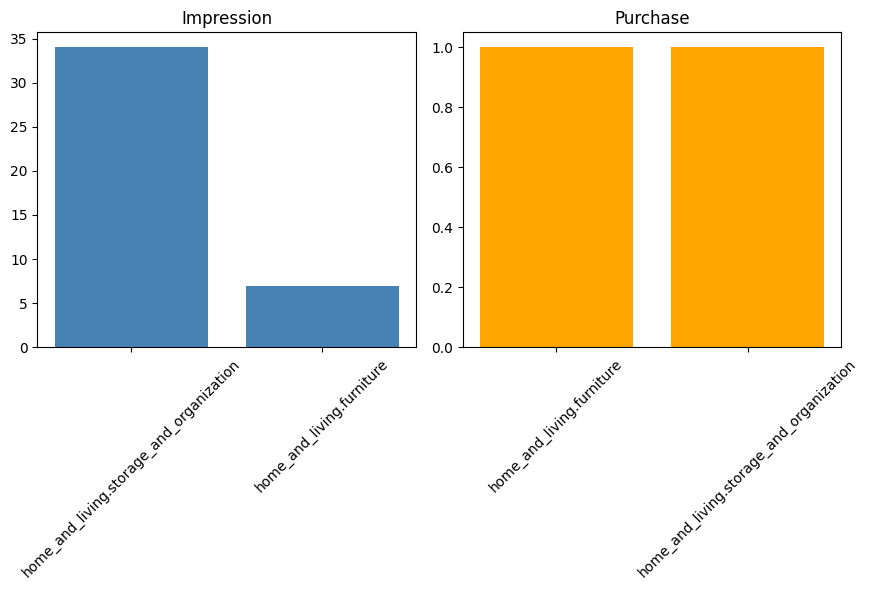

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(9, 6))
fig.set_tight_layout(True)

ax[0].bar(ipaths, icounts, color="steelblue")
ax[0].tick_params(axis='x', rotation=45)
ax[0].set_title("Impression")

ax[1].bar(ppaths, pcounts, color="orange")
ax[1].tick_params(axis='x', rotation=45)
ax[1].set_title("Purchase")

plt.show()
# fig.savefig("figs/expected_log_gms_dist_w_bias_listing_ids.png", dpi=300)

/var/folders/gn/nsnv1hf9035bqfv9srt9s6kh0000gp/T/ipykernel_35533/1697067555.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(9, 6))


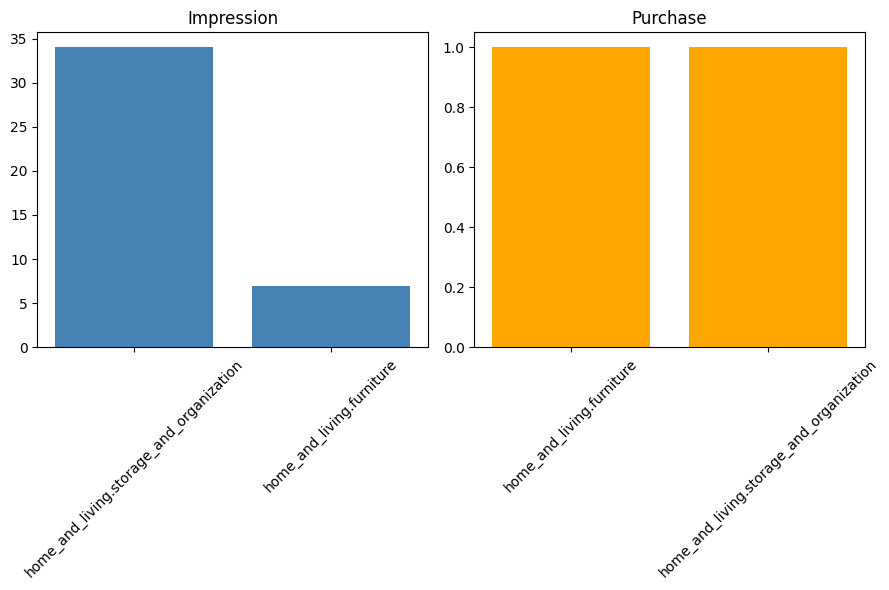

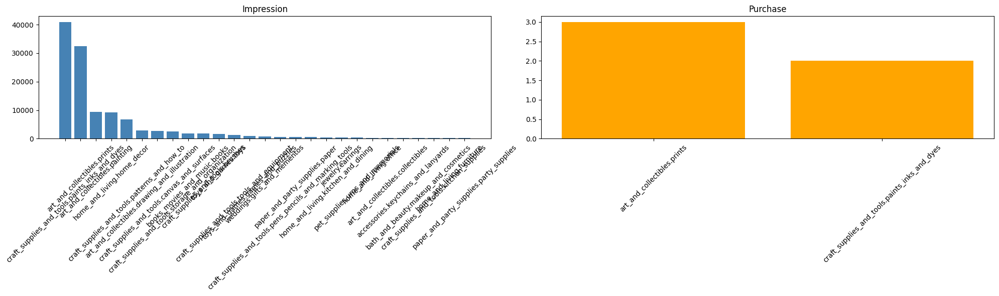

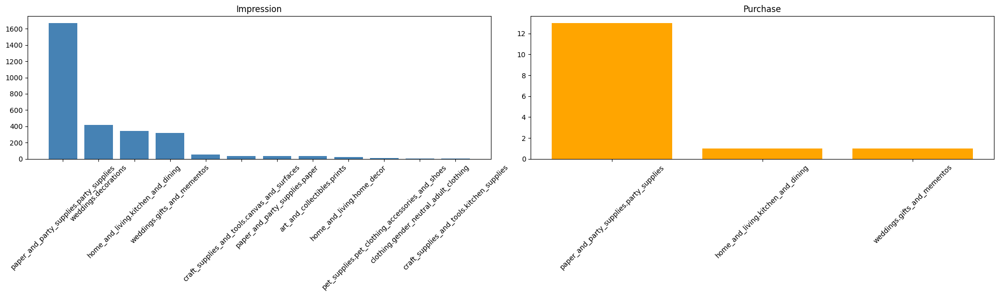

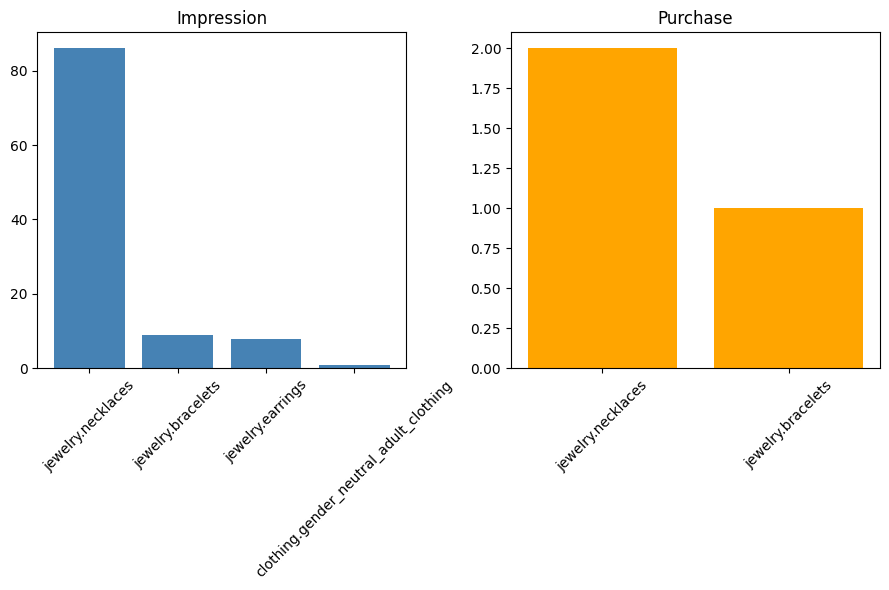

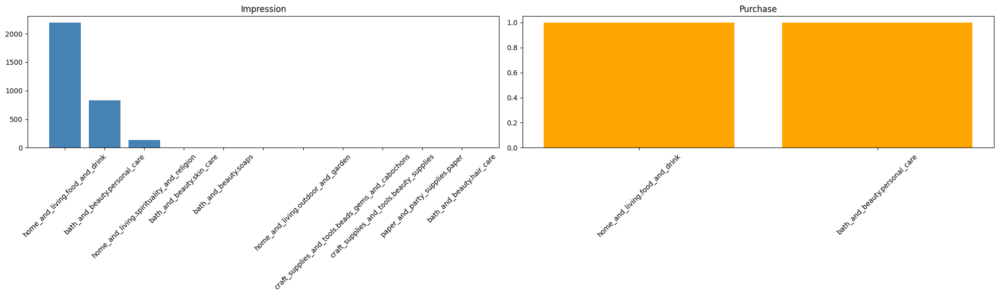

...

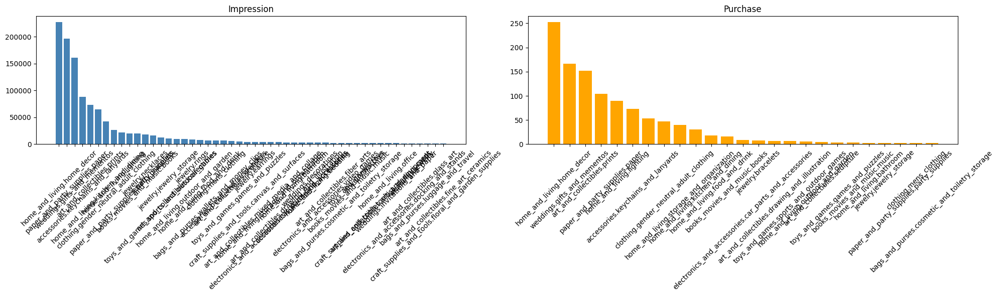

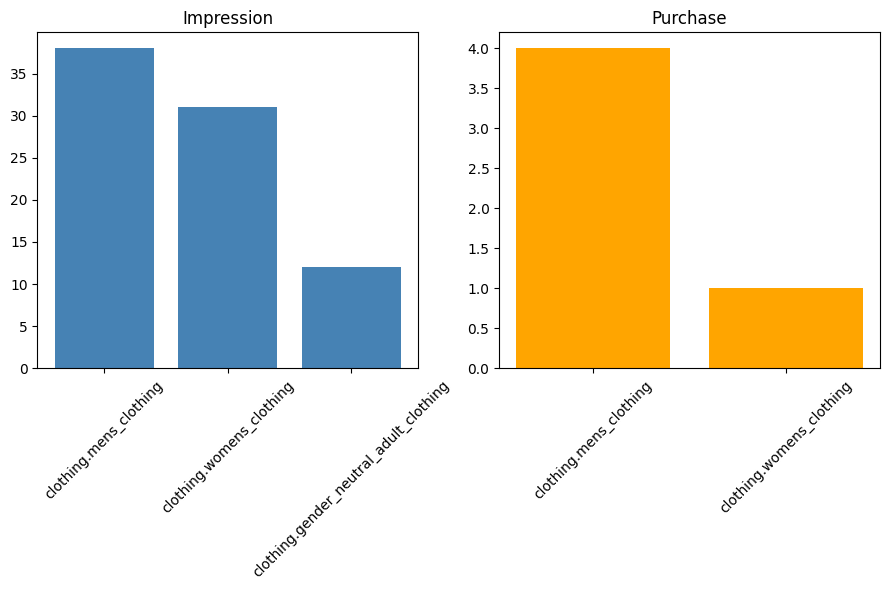

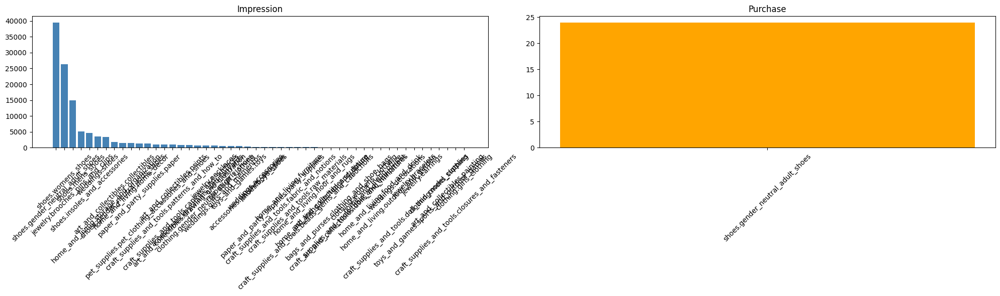

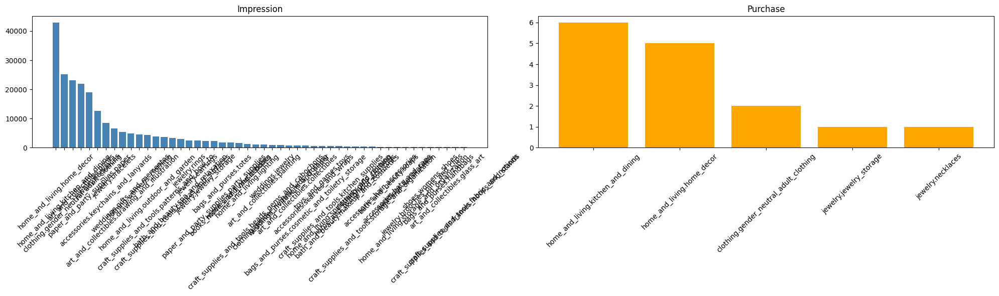

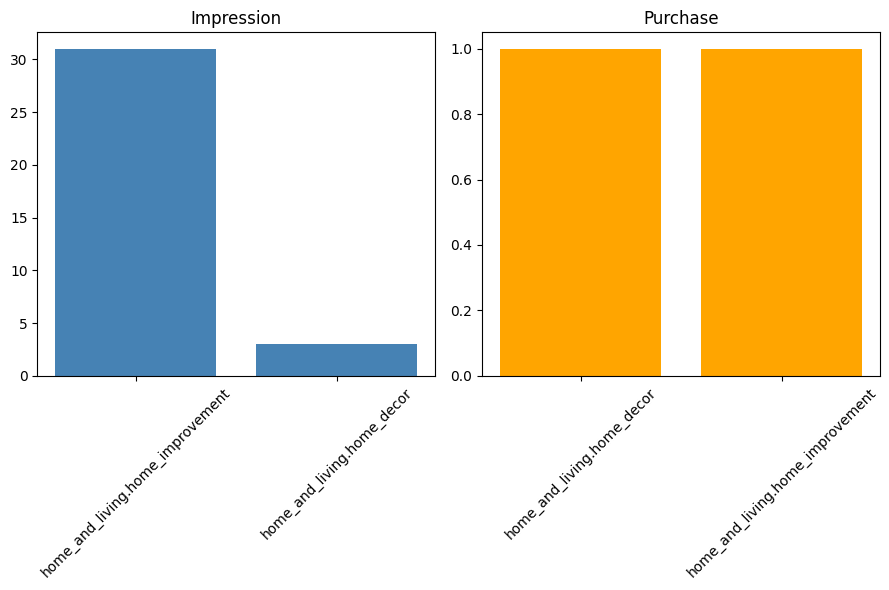

In [20]:
for i in range(df.shape[0]):
    qstr = df["query"][i]
    curr_bin = df.query_bin[i]
    broad_vs_direct = df.query_intent[i]
    
    bin_missing = df.query_bin.isna()[i]
    intent_missing = df.query_intent.isna()[i]
    
    ipaths = df.impression_paths[i]
    icounts = df.impression_counts[i]
    ppaths = df.purchase_paths[i]
    pcounts = df.purchase_counts[i]
    
    if len(ipaths) > 10: 
        fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    else:
        fig, ax = plt.subplots(1, 2, figsize=(9, 6))
    fig.set_tight_layout(True)

    ax[0].bar(ipaths, icounts, color="steelblue")
    ax[0].tick_params(axis='x', rotation=45)
    ax[0].set_title("Impression")

    ax[1].bar(ppaths, pcounts, color="orange")
    ax[1].tick_params(axis='x', rotation=45)
    ax[1].set_title("Purchase")
    
    # query bin save
    if not bin_missing:
        fig.savefig(f"query_bin/{curr_bin.replace('.','')}_{qstr}.png", dpi=300)
    
    # query intent save
    if not intent_missing:
        fig.savefig(f"query_intent/{broad_vs_direct}_{qstr}.png", dpi=300)
    
    # cross save
    if not bin_missing and not intent_missing:
        fig.savefig(f"bin_intent_cross/{curr_bin.replace('.','')}_{broad_vs_direct}_{qstr}.png", dpi=300)
